# Limonene Biofuel Study

In this notebook we demonstrate the usage of the Automatic Recommendation Tool (ART) to recommend strain designs for improving limonene production.

In this case we have proteomics data which will be used to determine maximum production of limonene in terms of total protein concentrations. Then target protein concentrations will be reported back to the user.


Tested using **ART_3.9.4** kernel on jprime.lbl.gov.

#### Files generated by running this notebook:

- a pickle file containing a trained ART object
- files containing predictive accuracy metrics
- plot of (cross-validated) predictions vs observations for the train data set
- `draws.txt`, containing all draws from the optimization procedure
- `recommendations.csv`, containing the ART recommendations for the next cycle
- plots of predictive distributions for the recommendations
- plots of success probabilities for the recommendations


## Setup

The first step is to make sure the `ART` library is available in your kernel.

Clone the corresponding git repository:


`git clone https://github.com/JBEI/AutomatedRecommendationTool.git`

or pull the latest version.

Information about licensing ART is available at https://github.com/JBEI/ART.



We can then add library to the path and do the necessary import:


In [1]:
import os
import sys
sys.path.append('../../')        # Make sure this is the location for the ART library

import warning_utils
warning_utils.filter_end_user_warnings()

from art.core import RecommendationEngine
from art.utility import load_study
from art import plot


WARNING (pytensor.tensor.blas): Using NumPy C-API based implementation for BLAS functions.


Load EDD study into a dataframe:

In [2]:
# Strongly recommended workflow is to *greatly* reduce preprocessing work by loading
# standardized data from the [Experiment Data Depot (EDD)](https://pubs.acs.org/doi/10.1021/acssynbio.7b00204).
# To skip the EDD registration step for new ART users & support automated notebook testing,
# load a data file downloaded from EDD instead.
load_from_edd = False

if load_from_edd:
    # Load data from EDD:
    #   * Bespoke data formats from well-meaning collaborators explode in complexity very quickly.
    #   * "Slug" is the final URL portion.  For this study, full URL is https://public-edd.jbei.org/s/pcap/
    edd_study_slug = 'pcap'
    edd_server = 'public-edd.jbei.org'
    df = load_study(edd_study_slug=edd_study_slug,edd_server=edd_server, default_to_system_user=False)
else:
    df = load_study(data_file="../../data/Limonene_data_for_ART.csv")


In [3]:
df.head()

,Unnamed: 0,Study ID,Study Name,Line ID,Replicate Key,Line Name,Line Description,Protocol,Assay ID,Assay Name,Formal Type,Measurement Type,Compartment,Units,Value,Hours
0,0,2843,Principal Component Analysis for Proteomics (P...,2844,768a1508-6a41-4c8e-a61b-0dc271381b07,2X-Mh,DH1 with two plasmid (medium + high copy) expr...,GC-MS,2874,2X-Mh,NaN,Limonene,2,mg/L,75.39261,24.0
1,1,2843,Principal Component Analysis for Proteomics (P...,2845,a810f8d4-4648-4272-a1c5-6dd2200cb8ff,B-Lm,DH1 with single plasmid (medium-copy) expressi...,GC-MS,2875,B-Lm,NaN,Limonene,2,mg/L,12.75786,24.0
2,2,2843,Principal Component Analysis for Proteomics (P...,2846,569fb1c4-3aa1-4209-903d-0bca3acd793f,BL-Mm,DH1 with two plasmid (B + high with extra copy...,GC-MS,2876,BL-Mm,NaN,Limonene,2,mg/L,119.81367,24.0
3,3,2843,Principal Component Analysis for Proteomics (P...,2847,dbebc6b2-ecac-4675-bae3-965080cecb12,2X-Ll,DH1 with two plasmid (medium + high copy) expr...,GC-MS,2877,2X-Ll,NaN,Limonene,2,mg/L,5.98466,24.0
4,4,2843,Principal Component Analysis for Proteomics (P...,2848,8def5195-6d31-493d-bd40-5da7f5c91798,A-Mm,DH1 with single plasmid (high-copy) expression...,GC-MS,2878,A-Mm,NaN,Limonene,2,mg/L,9.66957,24.0


Create Cycle 1 data by excluding 3 data points that were added to the initial study

In [4]:
df_cycle1 = df.copy()
df_cycle1 = df_cycle1[~df_cycle1['Line Name'].isin(['BL-Mm', 'BL-Ml', 'BL-Mh'])]

Create test data for Cycle 1

In [5]:
df_test = df.copy()
df_test = df_test[df_test['Line Name'].isin(['BL-Mm', 'BL-Ml', 'BL-Mh'])]

## Cycle 1

Next we define a dictionary that contains all of the settings that ART will use to find the recommendations.

In [6]:
art_params = {
    'input_vars': [
        'ATOB_ECOLI',
        'ERG8_YEAST',
        'IDI_ECOLI',
        'KIME_YEAST',
        'MVD1_YEAST',
        'Q40322_MENSP',
        'Q8LKJ3_ABIGR',
        'Q9FD86_STAAU',
        'Q9FD87_STAAU'
    ],
    'response_vars': ['Limonene'],
    'objective': 'maximize',
    'cross_val': True,
    'threshold': 0.2,
    'num_recommendations': 10,
    'verbose': 1,
    'seed': 10,
    'output_dir': '../../results/Limonene',
    'last_dashes_denote_replicates': False,
    'max_mcmc_cores': 2,
    'result_suffix': '_C1',
}


The objective is to predict strain designs which will **maximize** production. Successful designs are considered to be those that exceed the maximum observed production by 20%, as specified by the `threshold` variable.


ART identified 27 unique designs in the training data. 
Correctly communicating your designs is critical to building ART's model and to cross-validation.  We strongly suggest verifying ART's interpretation of your designs by inspecting the preprocessed DataFrame.  For example, if your ART instance is named `engine`, run `engine.df["Design"]`.  See documentation for `last_dashes_denote_replicates` for a description of how ART detects designs.
Cross-validating models…
Fitting L0 models…
Building TPOT models…


Version 0.12.0 of tpot is outdated. Version 0.12.1 was released Tuesday August 15, 2023.


Best pipeline: LassoLarsCV(PCA(input_matrix, iterated_power=8, svd_solver=randomized), normalize=False)
Done fitting L0 models in 6.94 s
Building ensemble model (2 sampling jobs)…


Multiprocess sampling (2 chains in 2 jobs)
NUTS: [sigma, omegas]


Sampling 2 chains for 1_000 tune and 10_000 draw iterations (2_000 + 20_000 draws total) took 13 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics
Version 0.12.0 of tpot is outdated. Version 0.12.1 was released Tuesday August 15, 2023.


Done building ensemble model in 14.52 s
Fitting L0 models…
Building TPOT models…
Best pipeline: ElasticNetCV(LinearSVR(StandardScaler(LassoLarsCV(input_matrix, normalize=True)), C=20.0, dual=True, epsilon=0.01, loss=epsilon_insensitive, tol=0.01), l1_ratio=0.8500000000000001, tol=0.01)


/usr/local/art/.venv/lib/python3.11/site-packages/sklearn/linear_model/_base.py:109: FutureWarning: 'normalize' was deprecated in version 1.2 and will be removed in 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsCV())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(


Done fitting L0 models in 43.07 s


/usr/local/art/.venv/lib/python3.11/site-packages/sklearn/linear_model/_base.py:109: FutureWarning: 'normalize' was deprecated in version 1.2 and will be removed in 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsCV())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/usr/local/art/.venv/lib/python3.11/site-packages/sklearn/linear_model/_base.py:109: FutureWarning: 'normalize' was deprecated in version 1.2 and will be removed in 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the p

Building ensemble model (2 sampling jobs)…


Multiprocess sampling (2 chains in 2 jobs)
NUTS: [sigma, omegas]


Sampling 2 chains for 1_000 tune and 10_000 draw iterations (2_000 + 20_000 draws total) took 15 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics
Version 0.12.0 of tpot is outdated. Version 0.12.1 was released Tuesday August 15, 2023.


Done building ensemble model in 16.64 s
Fitting L0 models…
Building TPOT models…
Best pipeline: ElasticNetCV(PCA(DecisionTreeRegressor(input_matrix, max_depth=1, min_samples_leaf=10, min_samples_split=8), iterated_power=10, svd_solver=randomized), l1_ratio=0.8, tol=0.0001)
Done fitting L0 models in 34.67 s
Building ensemble model (2 sampling jobs)…


Multiprocess sampling (2 chains in 2 jobs)
NUTS: [sigma, omegas]


Sampling 2 chains for 1_000 tune and 10_000 draw iterations (2_000 + 20_000 draws total) took 13 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics
Version 0.12.0 of tpot is outdated. Version 0.12.1 was released Tuesday August 15, 2023.


Done building ensemble model in 14.51 s
Fitting L0 models…
Building TPOT models…
Best pipeline: LinearSVR(FeatureAgglomeration(input_matrix, affinity=l1, linkage=average), C=15.0, dual=True, epsilon=0.001, loss=epsilon_insensitive, tol=0.1)
Done fitting L0 models in 3.93 s
Building ensemble model (2 sampling jobs)…


Multiprocess sampling (2 chains in 2 jobs)
NUTS: [sigma, omegas]


Sampling 2 chains for 1_000 tune and 10_000 draw iterations (2_000 + 20_000 draws total) took 12 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics
Version 0.12.0 of tpot is outdated. Version 0.12.1 was released Tuesday August 15, 2023.


Done building ensemble model in 12.75 s
Fitting L0 models…
Building TPOT models…
Best pipeline: RandomForestRegressor(RidgeCV(LassoLarsCV(FeatureAgglomeration(input_matrix, affinity=manhattan, linkage=average), normalize=False)), bootstrap=False, max_features=0.8500000000000001, min_samples_leaf=7, min_samples_split=14, n_estimators=100)
Done fitting L0 models in 76.01 s
Building ensemble model (2 sampling jobs)…


Multiprocess sampling (2 chains in 2 jobs)
NUTS: [sigma, omegas]


Sampling 2 chains for 1_000 tune and 10_000 draw iterations (2_000 + 20_000 draws total) took 22 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics
Version 0.12.0 of tpot is outdated. Version 0.12.1 was released Tuesday August 15, 2023.


Done building ensemble model in 23.36 s
Fitting L0 models…
Building TPOT models…
Best pipeline: AdaBoostRegressor(Binarizer(PolynomialFeatures(Normalizer(input_matrix, norm=l2), degree=2, include_bias=False, interaction_only=False), threshold=0.8), learning_rate=0.01, loss=exponential, n_estimators=100)
Done fitting L0 models in 56.98 s
Building ensemble model (2 sampling jobs)…


Multiprocess sampling (2 chains in 2 jobs)
NUTS: [sigma, omegas]


Sampling 2 chains for 1_000 tune and 10_000 draw iterations (2_000 + 20_000 draws total) took 24 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics
Version 0.12.0 of tpot is outdated. Version 0.12.1 was released Tuesday August 15, 2023.


Done building ensemble model in 25.33 s
Fitting L0 models…
Building TPOT models…
Best pipeline: RidgeCV(PolynomialFeatures(input_matrix, degree=2, include_bias=False, interaction_only=False))
Done fitting L0 models in 35.87 s
Building ensemble model (2 sampling jobs)…


Multiprocess sampling (2 chains in 2 jobs)
NUTS: [sigma, omegas]


Sampling 2 chains for 1_000 tune and 10_000 draw iterations (2_000 + 20_000 draws total) took 21 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics
Version 0.12.0 of tpot is outdated. Version 0.12.1 was released Tuesday August 15, 2023.


Done building ensemble model in 22.51 s
Fitting L0 models…
Building TPOT models…
Best pipeline: DecisionTreeRegressor(PCA(input_matrix, iterated_power=7, svd_solver=randomized), max_depth=10, min_samples_leaf=8, min_samples_split=19)
Done fitting L0 models in 4.73 s
Building ensemble model (2 sampling jobs)…


Multiprocess sampling (2 chains in 2 jobs)
NUTS: [sigma, omegas]


Sampling 2 chains for 1_000 tune and 10_000 draw iterations (2_000 + 20_000 draws total) took 16 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics
Version 0.12.0 of tpot is outdated. Version 0.12.1 was released Tuesday August 15, 2023.


Done building ensemble model in 16.86 s
Fitting L0 models…
Building TPOT models…
Best pipeline: AdaBoostRegressor(RBFSampler(CombineDFs(input_matrix, input_matrix), gamma=0.05), learning_rate=0.01, loss=linear, n_estimators=100)
Done fitting L0 models in 55.75 s
Building ensemble model (2 sampling jobs)…


Multiprocess sampling (2 chains in 2 jobs)
NUTS: [sigma, omegas]


Sampling 2 chains for 1_000 tune and 10_000 draw iterations (2_000 + 20_000 draws total) took 15 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics
Version 0.12.0 of tpot is outdated. Version 0.12.1 was released Tuesday August 15, 2023.


Done building ensemble model in 16.07 s
Fitting L0 models…
Building TPOT models…
Best pipeline: RidgeCV(ElasticNetCV(DecisionTreeRegressor(RBFSampler(input_matrix, gamma=0.2), max_depth=7, min_samples_leaf=13, min_samples_split=7), l1_ratio=0.55, tol=0.0001))
Done fitting L0 models in 37.41 s
Building ensemble model (2 sampling jobs)…


Multiprocess sampling (2 chains in 2 jobs)
NUTS: [sigma, omegas]


Sampling 2 chains for 1_000 tune and 10_000 draw iterations (2_000 + 20_000 draws total) took 15 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics


Done building ensemble model in 16.30 s


,MAE,MRAE(%),StdAE,MSE,$R^2$
Name,,,,,
Neural Regressor,23.851579,246.976228,20.570042,992.024470,-0.138856
Random Forest Regressor,20.964833,220.103900,16.144356,700.164437,0.196203
Support Vector Regressor,22.672080,168.477250,22.602414,1024.892333,-0.176589
Kernel Ridge Regressor,16.308900,116.680979,16.178472,527.723190,0.394167
K-NN Regressor,21.080870,243.864902,17.907046,765.065410,0.121696
Gaussian Process Regressor,20.326089,244.510548,15.606265,656.705399,0.246094
Gradient Boosting Regressor,21.416487,211.536239,19.493879,838.677249,0.037188
TPOT Regressor,19.006555,183.913304,16.959174,648.862698,0.255098
Ensemble Model,19.139546,186.115651,16.011199,622.680731,0.285155


Done with 10-fold cross-validation in 590.70 s


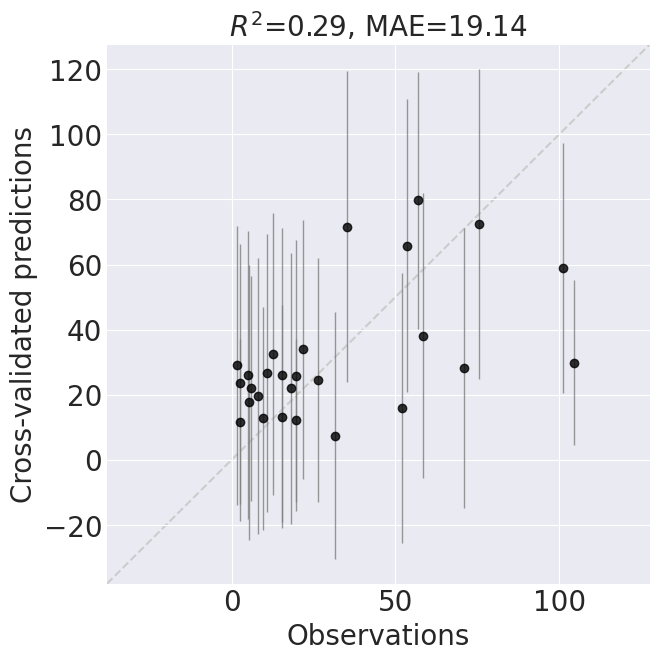

Building models…
Fitting L0 models…
Building TPOT models…


Version 0.12.0 of tpot is outdated. Version 0.12.1 was released Tuesday August 15, 2023.


Best pipeline: RandomForestRegressor(FeatureAgglomeration(RidgeCV(input_matrix), affinity=cosine, linkage=complete), bootstrap=False, max_features=0.8, min_samples_leaf=5, min_samples_split=8, n_estimators=100)
Done fitting L0 models in 35.87 s
Building ensemble model (2 sampling jobs)…


Multiprocess sampling (2 chains in 2 jobs)
NUTS: [sigma, omegas]


Sampling 2 chains for 1_000 tune and 10_000 draw iterations (2_000 + 20_000 draws total) took 16 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics


Done building ensemble model in 16.74 s


,MAE,MRAE(%),StdAE,MSE,$R^2$
Name,,,,,
Neural Regressor,0.076212,0.367732,0.119131,2.000036e-02,0.999977
Random Forest Regressor,6.909357,66.587986,5.528307,7.830139e+01,0.910109
Support Vector Regressor,20.702417,149.168889,22.123580,9.180428e+02,-0.053924
Kernel Ridge Regressor,10.695350,75.436142,11.327509,2.427030e+02,0.721374
K-NN Regressor,15.035582,177.427278,12.901354,3.925137e+02,0.549389
Gaussian Process Regressor,0.000401,0.003122,0.000485,3.959855e-07,1.000000
Gradient Boosting Regressor,0.062616,0.499297,0.042470,5.724422e-03,0.999993
TPOT Regressor,10.872115,97.162888,8.670697,1.933839e+02,0.777993
Ensemble Model,6.078001,57.976243,6.093036,7.406719e+01,0.914970


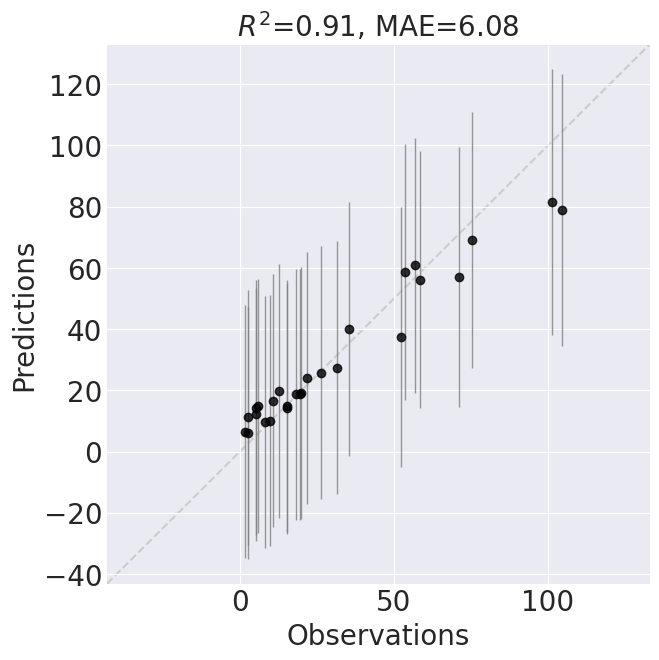

Done building models in 59.82 s
Starting parallel tempering using 2 chains…
Done with parallel tempering in 149.36 s
Choosing recommendations (19,800 candidates)…


Done choosing recommendations in 0.04 s


,ATOB_ECOLI,ERG8_YEAST,IDI_ECOLI,KIME_YEAST,MVD1_YEAST,Q40322_MENSP,Q8LKJ3_ABIGR,Q9FD86_STAAU,Q9FD87_STAAU,Limonene
0,0.163666,0.146007,2.701768,0.415690,0.632728,11.669454,4.658772,0.434630,0.595815,124.808869
1,0.169738,0.131509,2.551304,0.412351,1.021324,11.613402,4.732583,0.421631,0.557032,124.720985
2,0.212717,0.166146,2.660212,0.414464,0.389766,11.659111,4.687163,0.418870,0.569835,124.434305
3,0.162783,0.169130,2.657148,0.410908,0.455395,11.487159,4.743591,0.448947,0.631549,124.204531
4,0.159987,0.133093,2.804265,0.409429,1.296221,11.474345,4.669964,0.430278,0.597617,123.973954
5,0.162246,0.186117,2.369363,0.414851,0.665306,11.574335,4.714247,0.476413,0.567653,123.945349
6,0.164457,0.205240,2.620675,0.405022,0.817392,11.643246,4.690557,0.428150,0.546182,123.919846
7,0.160416,0.187200,2.780852,0.415758,1.037996,11.334851,4.722007,0.454942,0.575383,123.906791
8,0.220482,0.130255,2.551172,0.411023,1.021199,11.613086,4.735969,0.423942,0.554350,123.835854
9,0.210702,0.201545,2.675059,0.413714,0.361468,11.640970,4.711198,0.428753,0.594842,123.781650


Sampling: [y]


Sampling posterior predictive distributions…
Done sampling in 0.73 s


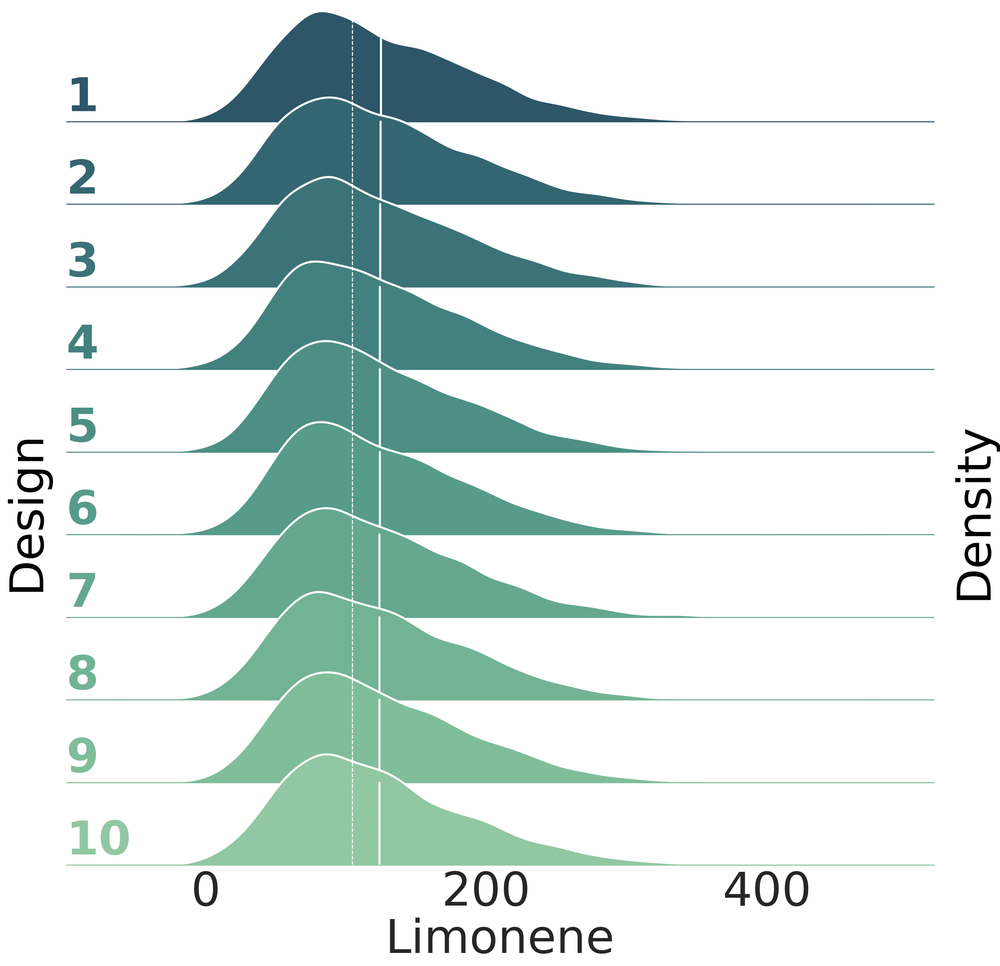

Sampling: [y]


Computing success probabilities…
Sampling posterior predictive distributions…
Done sampling in 0.73 s
Done computing success probabilities in 0.73 s


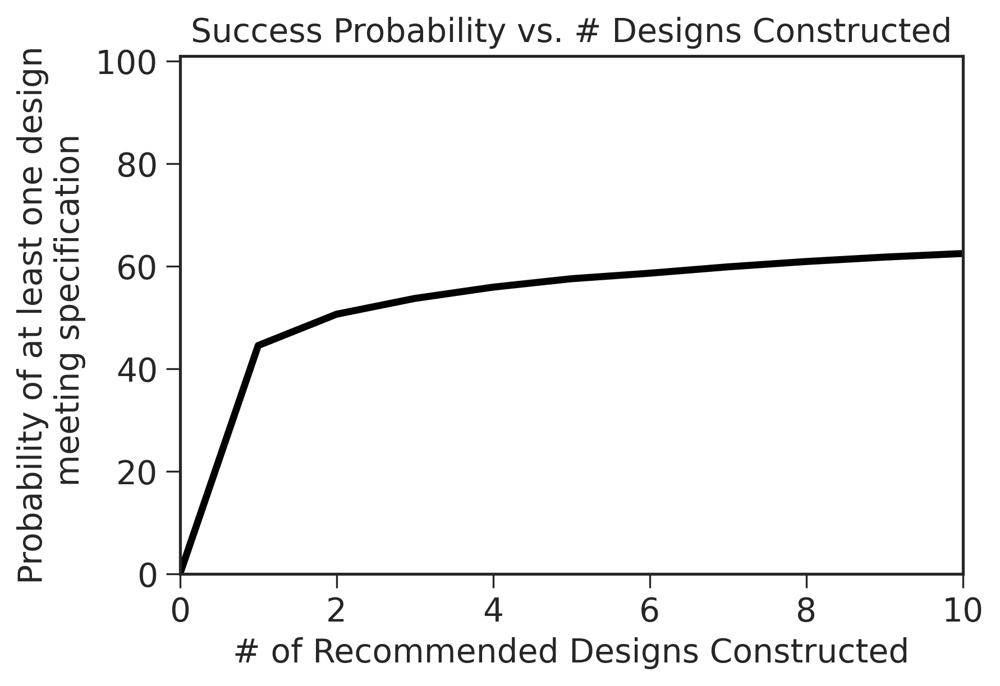

In [7]:
art = RecommendationEngine(df=df_cycle1, **art_params)

Create an object for the test data

In [8]:
art_params['build_model'] = False
art_test = RecommendationEngine(df=df_test, cross_val_partitions=3, **art_params)
art_test.df

ART identified 3 unique designs in the training data. 
Correctly communicating your designs is critical to building ART's model and to cross-validation.  We strongly suggest verifying ART's interpretation of your designs by inspecting the preprocessed DataFrame.  For example, if your ART instance is named `engine`, run `engine.df["Design"]`.  See documentation for `last_dashes_denote_replicates` for a description of how ART detects designs.


Input Variables                                                          \
           ATOB_ECOLI ERG8_YEAST IDI_ECOLI KIME_YEAST MVD1_YEAST Q40322_MENSP   
BL.Mh         1.95983    0.78130   2.59550    1.42496    4.10495     13.59919   
BL.Ml         0.24012    0.19050   0.94884    0.38070    1.30811      2.72406   
BL.Mm         1.25540    0.58985   2.29065    1.04860    3.19300     11.31405   

                                             Response Variables Design  
      Q8LKJ3_ABIGR Q9FD86_STAAU Q9FD87_STAAU           Limonene         
BL.Mh      1.86762      0.39057      0.65389          127.99494  BL.Mh  
BL.Ml      0.11237      0.05002      0.08503            6.72018  BL.Ml  
BL.Mm      1.63235      0.25975      0.41045          119.81367  BL.Mm

We can evaluate models on the test data specifically:

In [10]:
X_test = art_test.df['Input Variables'].values
y_test = art_test.df['Response Variables'].values
art.evaluate_models(X_test, y_test)


,MAE,MRAE(%),StdAE,MSE,$R^2$
Name,,,,,
Neural Regressor,291.757069,593.284976,158.983643,110397.986166,-35.045526
Random Forest Regressor,39.483914,141.317376,11.980547,1702.512938,0.444121
Support Vector Regressor,74.096364,119.781804,43.479950,7380.777219,-1.409863
Kernel Ridge Regressor,83.062916,74.268374,57.744805,10233.910556,-2.341426
K-NN Regressor,54.141485,177.921410,18.353236,3268.141640,-0.067066
Gaussian Process Regressor,68.196212,144.421284,34.906721,5869.202473,-0.916326
Gradient Boosting Regressor,36.571311,210.703630,3.530707,1349.926648,0.559242
TPOT Regressor,55.731670,106.529231,30.311190,4024.787306,-0.314114
Ensemble Model,12.772450,140.811950,10.847310,280.799621,0.908317


Plot observations vs. posterior predictive distributions for the train (black) and test (blue) data.

Cross-validated data:

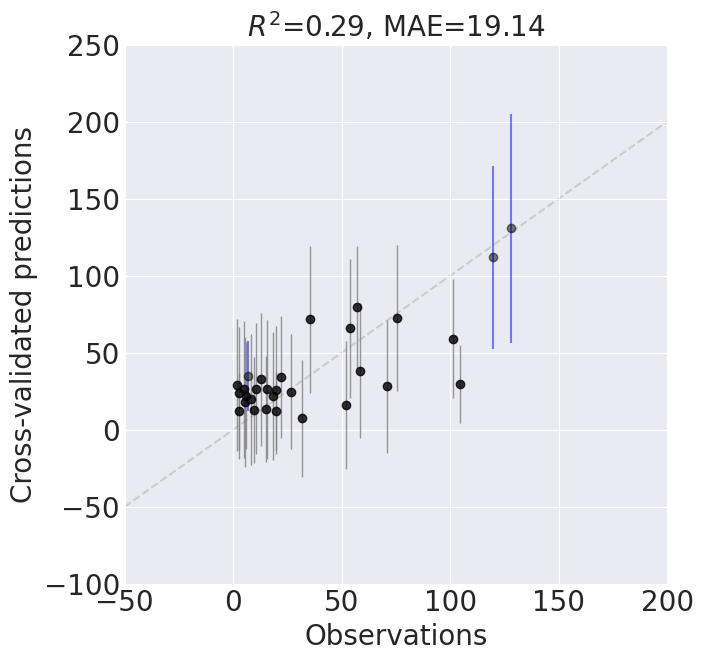

In [11]:
plot.predictions_vs_observations(art, cv=True, error_bars=True,
                                 X_test=X_test, y_test=y_test,
                                 x_limits=[[-50, 200]], y_limits=[[-100, 250]])

Train data:

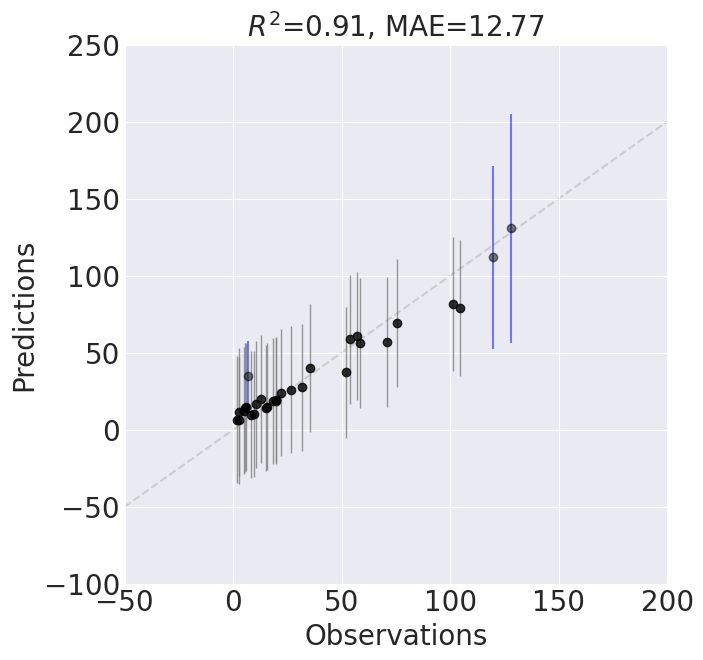

In [12]:
plot.predictions_vs_observations(art, cv=False, error_bars=True,
                                 X_test=X_test, y_test=y_test,
                                 x_limits=[[-50, 200]], y_limits=[[-100, 250]])

To show violin plots representing the predictive probability distribution instead of error bars run:

Sampling: [y]


Sampling posterior predictive distributions…
Done sampling in 0.71 s


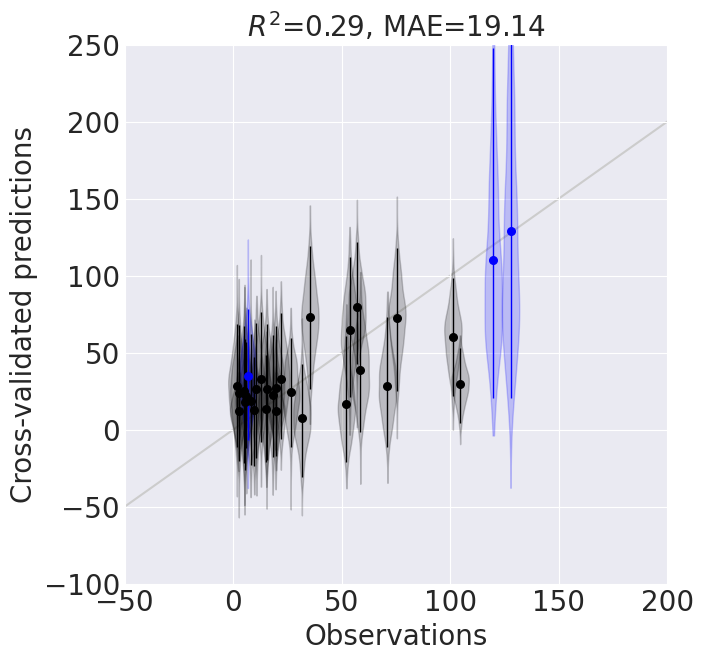

In [13]:
plot.predictions_distr_vs_observations(art, cv=True, widths=8,
                                       X_test=X_test, y_test=y_test,
                                       x_limits=[[-50, 200]], y_limits=[[-100, 250]])

Plot the mean (lower triangle) and standard deviation (upper triangle) of the final model as functions of each pair of input varibles:

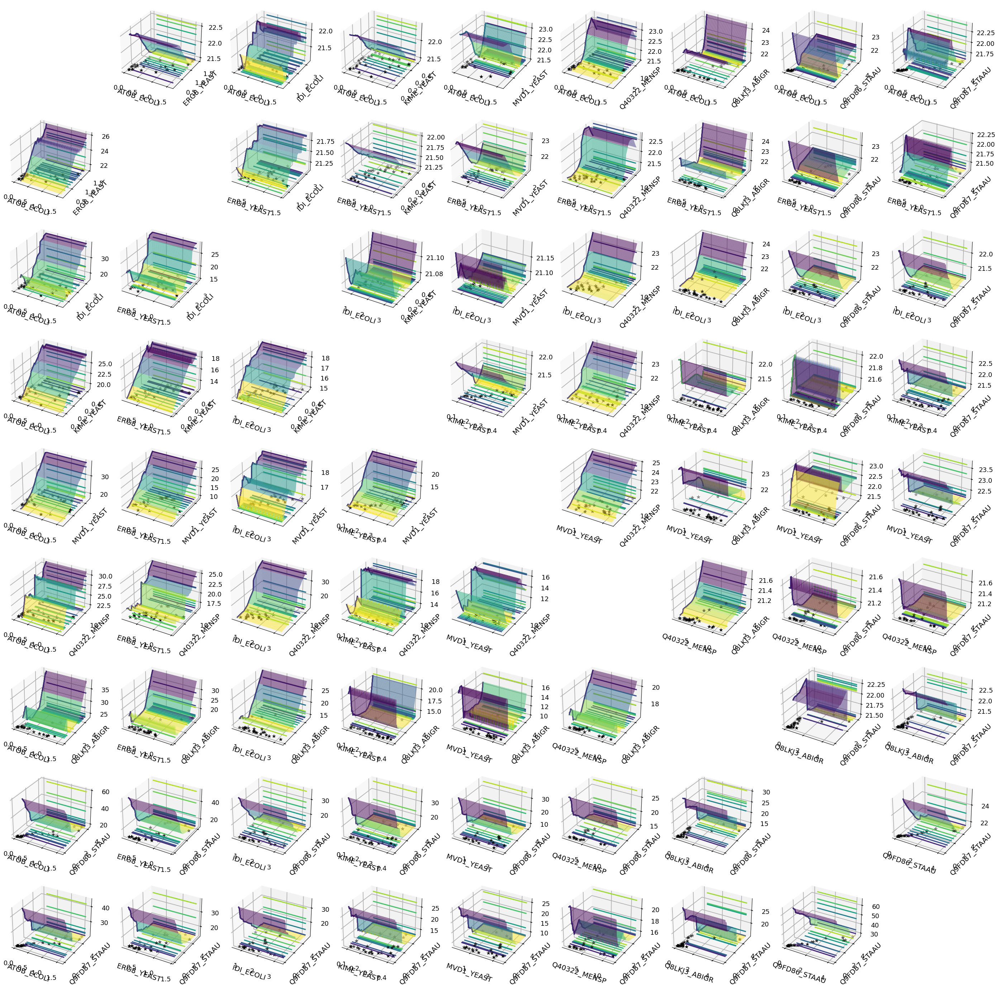

In [15]:
plot.model_pairwise(art)

Sampling-based optimization and generation of recommendations was ran above with the default options (`niter=100000` for number of samples collected, `alpha=None` for a purely exploitative strategy, and `rel_rec_distance=20%` for relative recommendations distance).


In [16]:
os.rename(f'{art.output_dir}/draws_C1.txt',
          f'{art.output_dir}/draws_niter100K_C1.txt')
os.rename(f'{art.output_dir}/recommendations_C1.csv',
          f'{art.output_dir}/recommendations_niter100K_C1.csv')

Alternatively, you can change those parameters to generate recommendations from a longer/shorter sampling run or a different exploration-exploitation strategy:

Starting parallel tempering using 2 chains…
Done with parallel tempering in 143.27 s
Choosing recommendations (19,800 candidates)…


Done choosing recommendations in 0.05 s


,ATOB_ECOLI,ERG8_YEAST,IDI_ECOLI,KIME_YEAST,MVD1_YEAST,Q40322_MENSP,Q8LKJ3_ABIGR,Q9FD86_STAAU,Q9FD87_STAAU,Limonene
0,0.160989,0.167390,2.710458,0.414237,0.538646,11.624715,4.733106,0.434214,0.568614,125.328200
1,0.163209,0.134867,2.734702,0.410091,1.188812,11.648064,4.707366,0.444163,0.586021,124.540565
2,0.173027,0.185815,2.575289,0.415360,0.380255,11.699857,4.702743,0.464416,0.553579,124.447352
3,0.168963,0.145610,2.759381,0.414385,0.349555,11.542570,4.726641,0.421247,0.614605,124.332102
4,0.204374,0.172962,2.683791,0.415775,0.582856,11.663352,4.742939,0.485323,0.555176,124.265689
5,0.201165,0.131552,2.733807,0.412194,1.188895,11.647911,4.711729,0.439963,0.585631,124.115070
6,0.167059,0.138604,2.614143,0.393781,0.833675,11.654127,4.743541,0.439987,0.568686,124.108641
7,0.159828,0.196558,2.586520,0.403174,1.062488,11.659526,4.724659,0.421652,0.586960,123.945354
8,0.161325,0.163090,2.516869,0.393805,0.657565,11.585933,4.730484,0.448818,0.546670,123.869284
9,0.232494,0.151984,2.632730,0.415785,0.707334,11.607429,4.748393,0.424433,0.599044,123.713419


Sampling: [y]


Sampling posterior predictive distributions…
Done sampling in 0.74 s


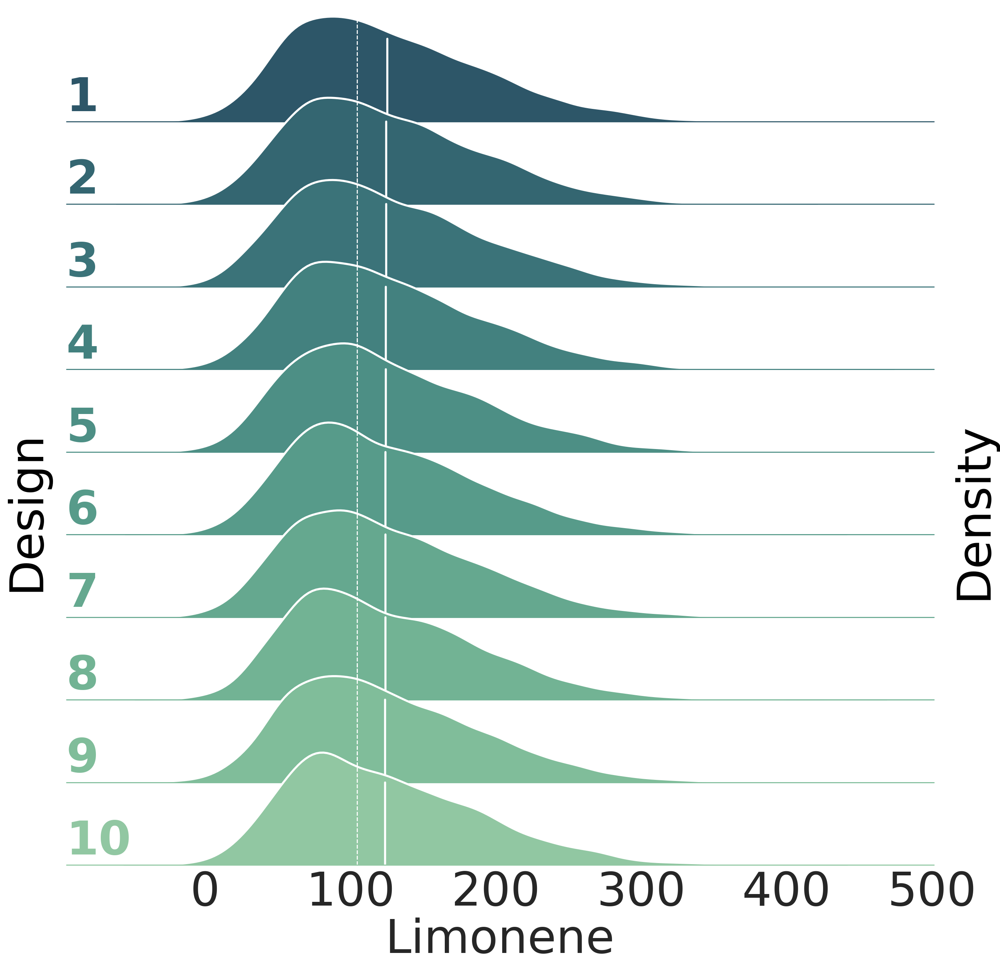

Sampling: [y]


Computing success probabilities…
Sampling posterior predictive distributions…
Done sampling in 0.72 s
Done computing success probabilities in 0.72 s


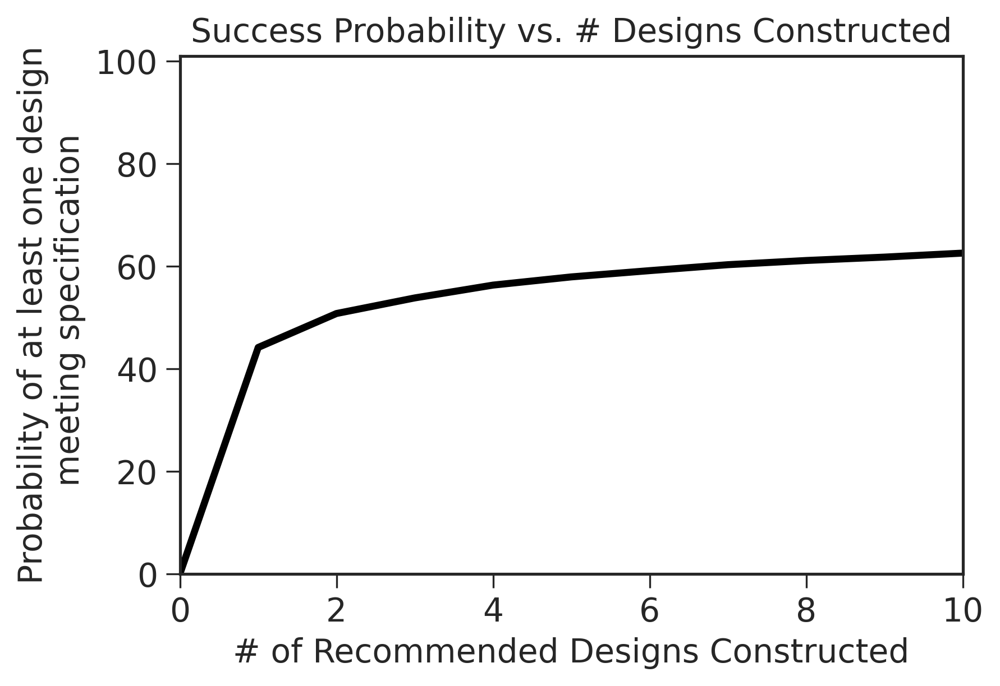

In [17]:
art.niter = 1000000
art.recommend()

Calculate and visualize the success probabilities if the recommended strains are being engineered.

Sampling: [y]


Computing success probabilities…
Sampling posterior predictive distributions…
Done sampling in 0.71 s
Done computing success probabilities in 0.71 s


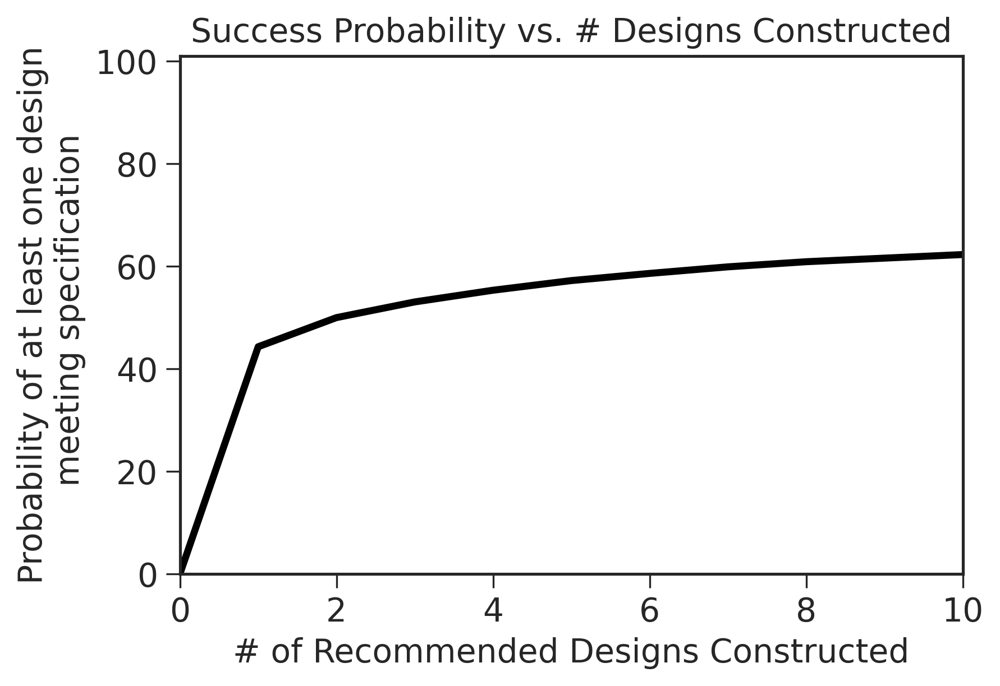

In [19]:
cumulative_success_prob = art.compute_success_prob(current_best=art.find_current_best())
plot.success_prob(art, cumulative_success_prob)

Plot first two principal components of recommendations (in green) with observed data (in red) and test data (yellow)

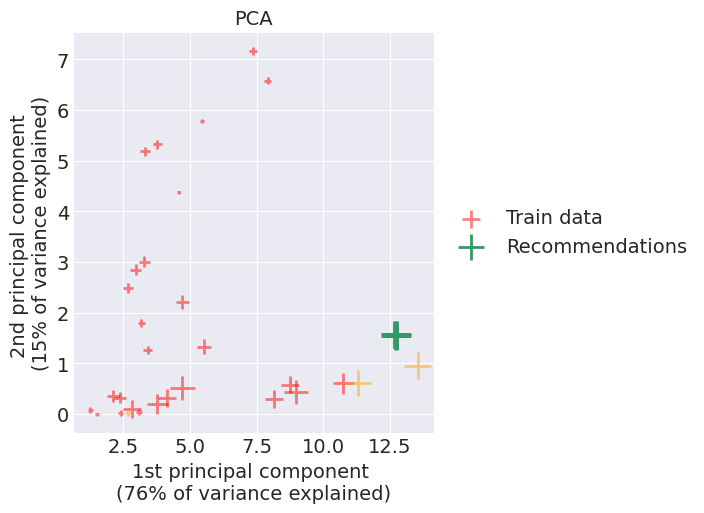

In [21]:
plot.recommendations_pc(art, plot_scale_factor=3, X_test=X_test, objective_value_y_test=y_test)


Heatmap of the mean of the final model as function of the two principal components of input varibles:

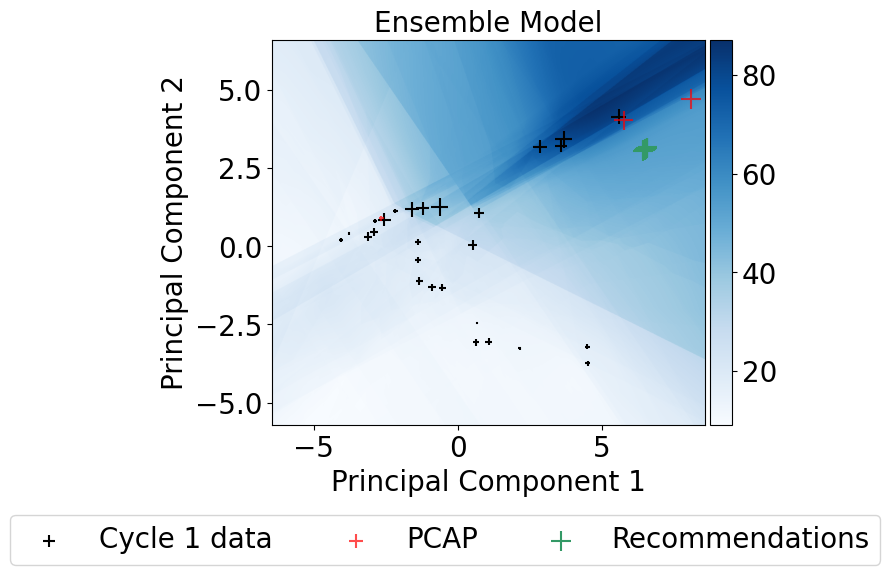

In [22]:
model = art
plot.plot_model(model, art, X_test, y_test, scaling_factor=1.5,
                midpoint=0.6,
                title='Ensemble Model', plot_points=True)


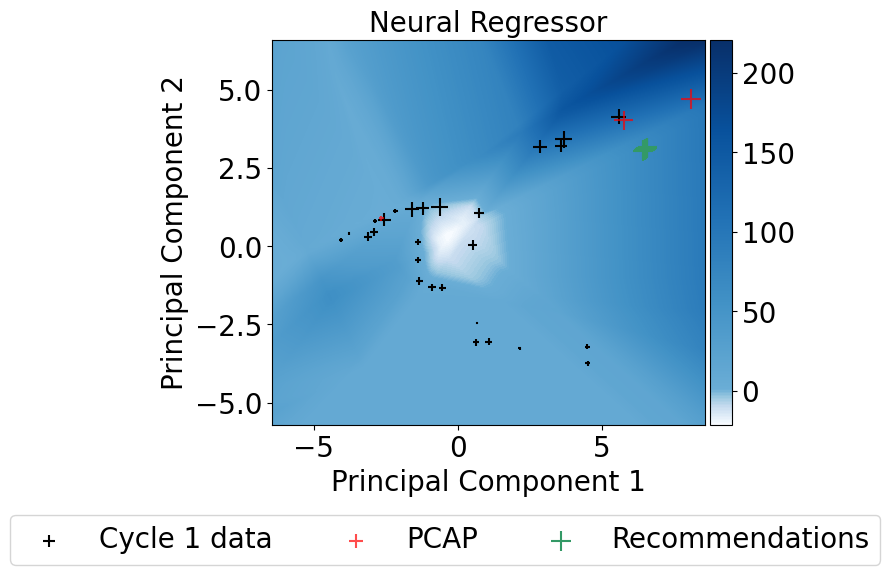

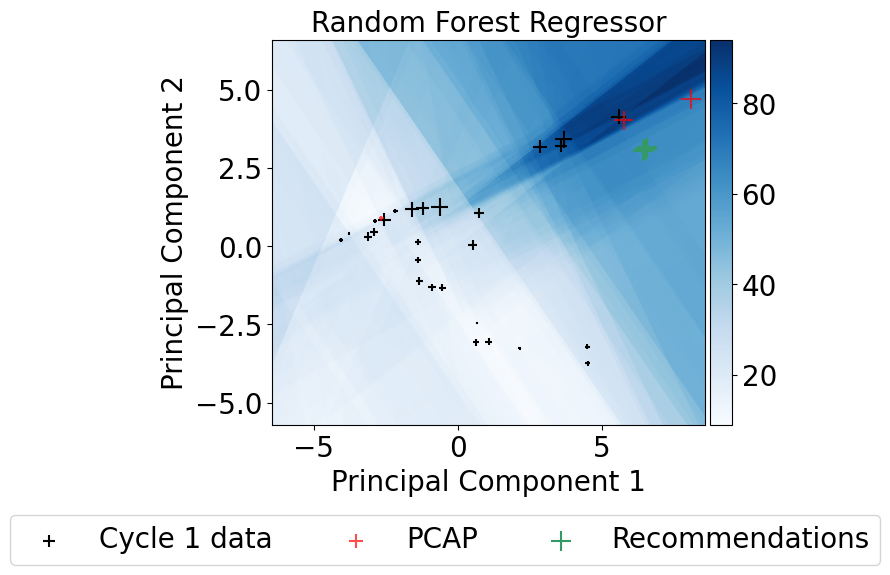

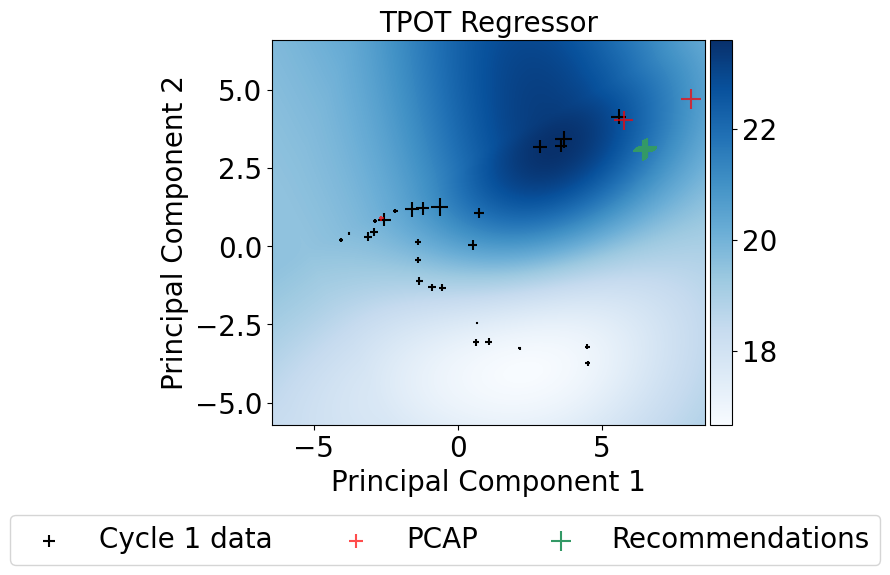

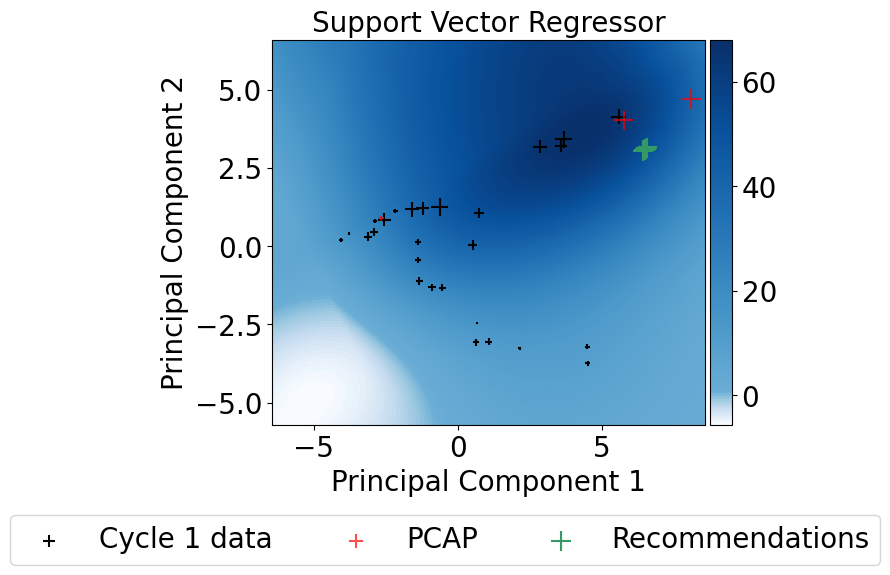

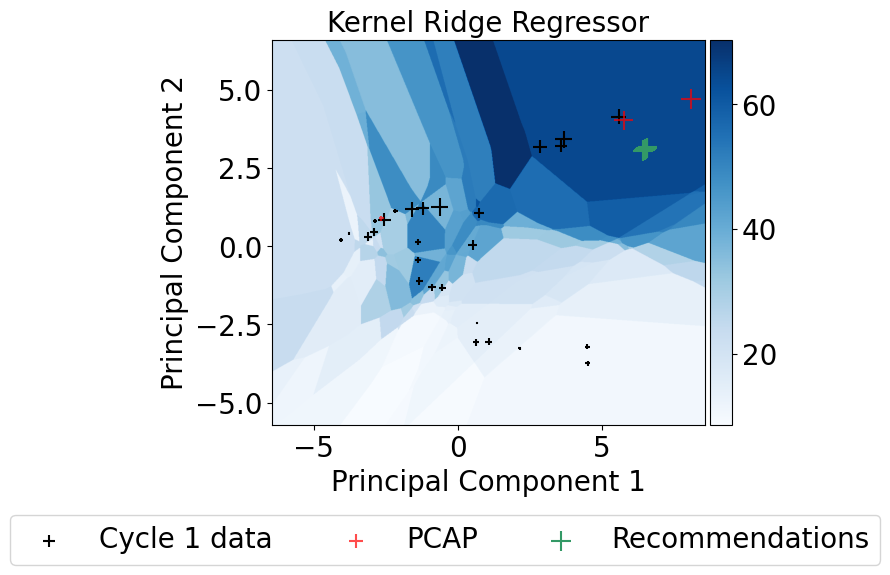

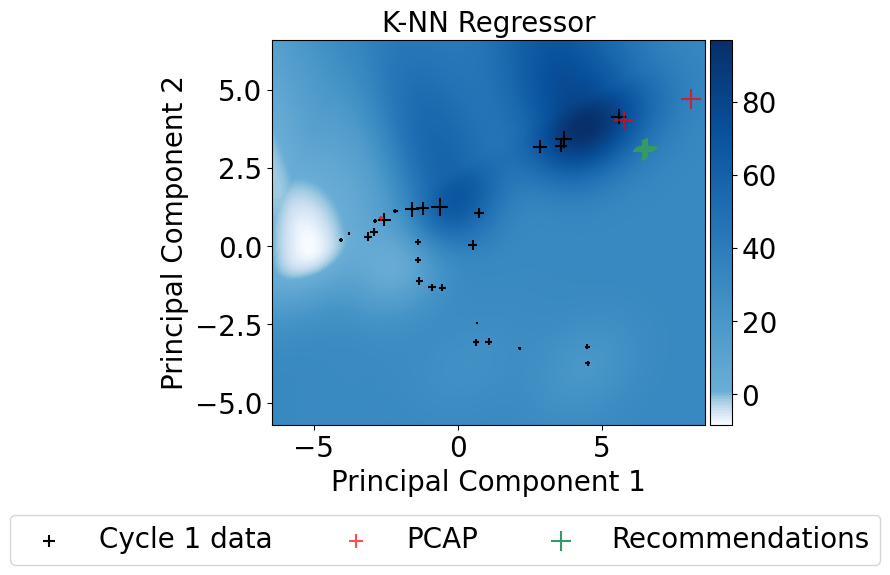

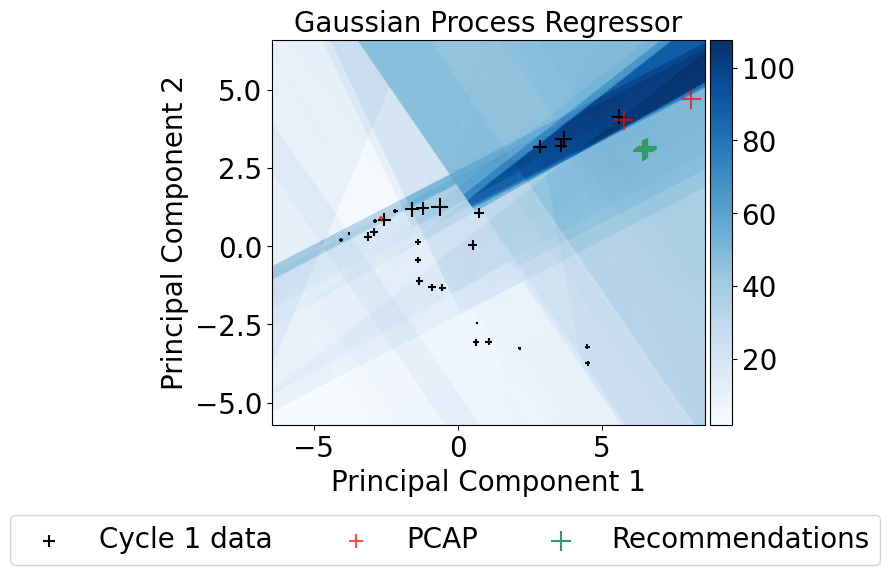

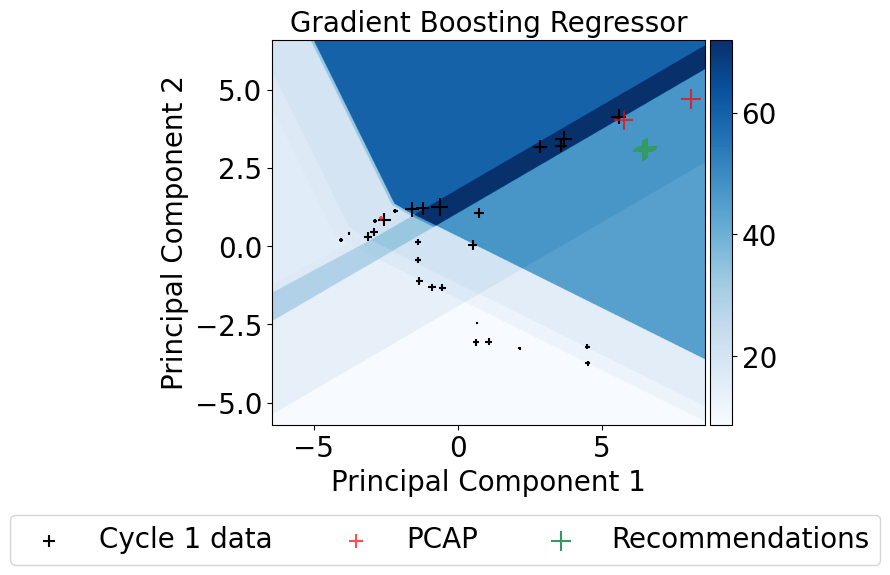

In [25]:
titles = ['Neural Regressor',
          'Random Forest Regressor',
          'TPOT Regressor',
          'Support Vector Regressor',
          'Kernel Ridge Regressor',
          'K-NN Regressor',
          'Gaussian Process Regressor',
          'Gradient Boosting Regressor']

for model,title in zip(art.l0_learners.model_dfs[0]['Model'][:],titles):
    plot.plot_model(model, art, X_test, y_test, scaling_factor=1.5,
               midpoint=0.6, title=title, plot_points=True)


Visualize input data pairwise. The size of each point represents the level of output variable (limonene production).

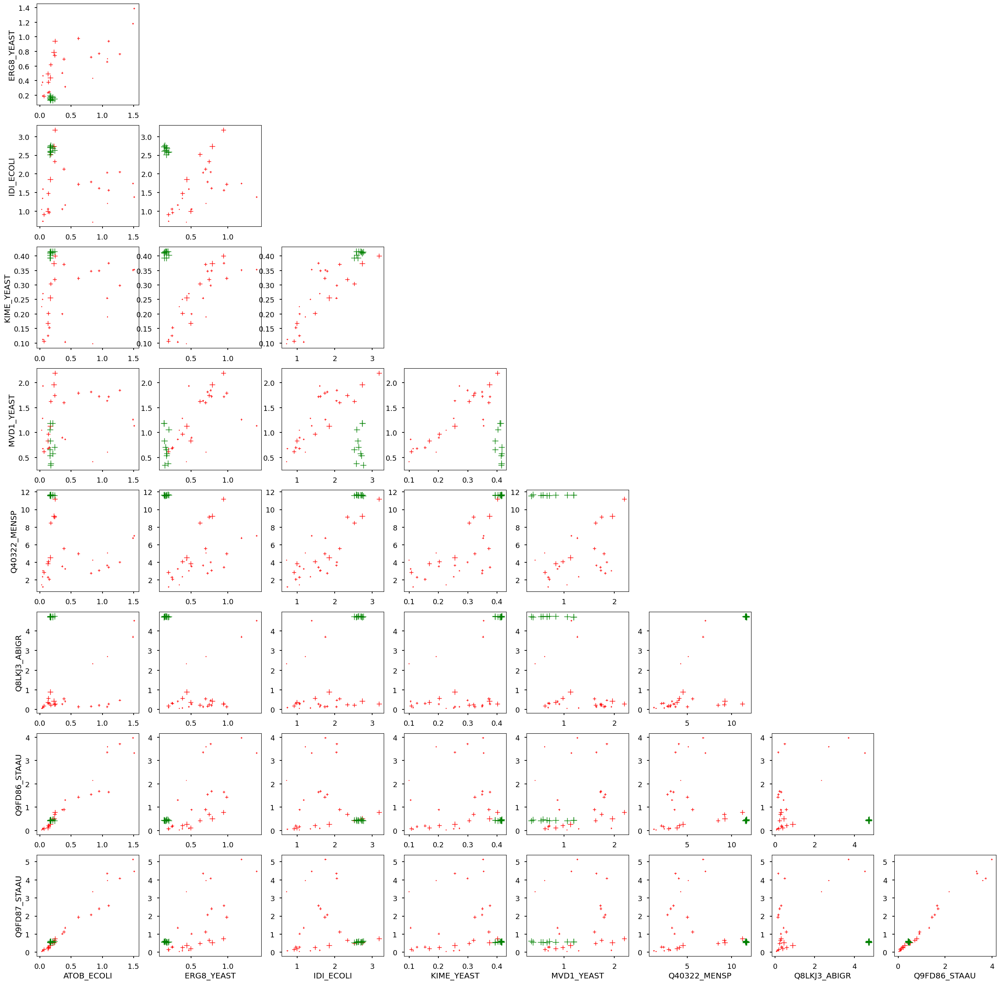

In [26]:
plot.data_pairwise(art, recommendations=art.recommendations)

In [27]:
art.save()

## Recommend strains for the next DBTL cycle

Repeat the process by including all data points.

In [29]:
art_params['build_model'] = True
art_params['result_suffix'] = '_C2'

ART identified 30 unique designs in the training data. 
Correctly communicating your designs is critical to building ART's model and to cross-validation.  We strongly suggest verifying ART's interpretation of your designs by inspecting the preprocessed DataFrame.  For example, if your ART instance is named `engine`, run `engine.df["Design"]`.  See documentation for `last_dashes_denote_replicates` for a description of how ART detects designs.
Cross-validating models…
Fitting L0 models…
Building TPOT models…


Version 0.12.0 of tpot is outdated. Version 0.12.1 was released Tuesday August 15, 2023.


Best pipeline: LinearSVR(LassoLarsCV(input_matrix, normalize=True), C=20.0, dual=True, epsilon=0.0001, loss=squared_epsilon_insensitive, tol=0.001)


/usr/local/art/.venv/lib/python3.11/site-packages/sklearn/linear_model/_base.py:109: FutureWarning: 'normalize' was deprecated in version 1.2 and will be removed in 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsCV())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/usr/local/art/.venv/lib/python3.11/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Done fitting L0 models in 23.06 s


/usr/local/art/.venv/lib/python3.11/site-packages/sklearn/linear_model/_base.py:109: FutureWarning: 'normalize' was deprecated in version 1.2 and will be removed in 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsCV())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/usr/local/art/.venv/lib/python3.11/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/usr/local/art/.venv/lib/python3.11/site-packages/sklearn/linear_model/_base.py:109: FutureWarning: '

Building ensemble model (2 sampling jobs)…


Multiprocess sampling (2 chains in 2 jobs)
NUTS: [sigma, omegas]


Sampling 2 chains for 1_000 tune and 10_000 draw iterations (2_000 + 20_000 draws total) took 16 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics
Version 0.12.0 of tpot is outdated. Version 0.12.1 was released Tuesday August 15, 2023.


Done building ensemble model in 18.04 s
Fitting L0 models…
Building TPOT models…
Best pipeline: LinearSVR(input_matrix, C=0.1, dual=True, epsilon=0.0001, loss=squared_epsilon_insensitive, tol=0.1)
Done fitting L0 models in 4.48 s
Building ensemble model (2 sampling jobs)…


Multiprocess sampling (2 chains in 2 jobs)
NUTS: [sigma, omegas]


Sampling 2 chains for 1_000 tune and 10_000 draw iterations (2_000 + 20_000 draws total) took 19 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics
Version 0.12.0 of tpot is outdated. Version 0.12.1 was released Tuesday August 15, 2023.


Done building ensemble model in 20.17 s
Fitting L0 models…
Building TPOT models…
Best pipeline: ElasticNetCV(PolynomialFeatures(input_matrix, degree=2, include_bias=False, interaction_only=False), l1_ratio=0.2, tol=0.1)
Done fitting L0 models in 57.28 s
Building ensemble model (2 sampling jobs)…


Multiprocess sampling (2 chains in 2 jobs)
NUTS: [sigma, omegas]


Sampling 2 chains for 1_000 tune and 10_000 draw iterations (2_000 + 20_000 draws total) took 14 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics
Version 0.12.0 of tpot is outdated. Version 0.12.1 was released Tuesday August 15, 2023.


Done building ensemble model in 15.92 s
Fitting L0 models…
Building TPOT models…
Best pipeline: ElasticNetCV(input_matrix, l1_ratio=0.35000000000000003, tol=0.001)
Done fitting L0 models in 4.77 s
Building ensemble model (2 sampling jobs)…


Multiprocess sampling (2 chains in 2 jobs)
NUTS: [sigma, omegas]


Sampling 2 chains for 1_000 tune and 10_000 draw iterations (2_000 + 20_000 draws total) took 21 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics
Version 0.12.0 of tpot is outdated. Version 0.12.1 was released Tuesday August 15, 2023.


Done building ensemble model in 22.00 s
Fitting L0 models…
Building TPOT models…
Best pipeline: ElasticNetCV(ElasticNetCV(PolynomialFeatures(input_matrix, degree=2, include_bias=False, interaction_only=False), l1_ratio=0.05, tol=0.1), l1_ratio=0.1, tol=0.001)
Done fitting L0 models in 44.90 s
Building ensemble model (2 sampling jobs)…


Multiprocess sampling (2 chains in 2 jobs)
NUTS: [sigma, omegas]


Sampling 2 chains for 1_000 tune and 10_000 draw iterations (2_000 + 20_000 draws total) took 19 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics
Version 0.12.0 of tpot is outdated. Version 0.12.1 was released Tuesday August 15, 2023.


Done building ensemble model in 20.02 s
Fitting L0 models…
Building TPOT models…
Best pipeline: SGDRegressor(ZeroCount(input_matrix), alpha=0.001, eta0=1.0, fit_intercept=True, l1_ratio=0.75, learning_rate=constant, loss=huber, penalty=elasticnet, power_t=50.0)
Done fitting L0 models in 34.90 s
Building ensemble model (2 sampling jobs)…


Multiprocess sampling (2 chains in 2 jobs)
NUTS: [sigma, omegas]


Sampling 2 chains for 1_000 tune and 10_000 draw iterations (2_000 + 20_000 draws total) took 17 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics
Version 0.12.0 of tpot is outdated. Version 0.12.1 was released Tuesday August 15, 2023.


Done building ensemble model in 18.84 s
Fitting L0 models…
Building TPOT models…
Best pipeline: LinearSVR(PolynomialFeatures(VarianceThreshold(input_matrix, threshold=0.2), degree=2, include_bias=False, interaction_only=False), C=0.01, dual=False, epsilon=1.0, loss=squared_epsilon_insensitive, tol=0.01)
Done fitting L0 models in 21.72 s
Building ensemble model (2 sampling jobs)…


Multiprocess sampling (2 chains in 2 jobs)
NUTS: [sigma, omegas]


Sampling 2 chains for 1_000 tune and 10_000 draw iterations (2_000 + 20_000 draws total) took 17 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics
Version 0.12.0 of tpot is outdated. Version 0.12.1 was released Tuesday August 15, 2023.


Done building ensemble model in 18.08 s
Fitting L0 models…
Building TPOT models…
Best pipeline: ElasticNetCV(RandomForestRegressor(input_matrix, bootstrap=False, max_features=0.1, min_samples_leaf=7, min_samples_split=18, n_estimators=100), l1_ratio=0.6000000000000001, tol=0.001)
Done fitting L0 models in 4.80 s
Building ensemble model (2 sampling jobs)…


Multiprocess sampling (2 chains in 2 jobs)
NUTS: [sigma, omegas]


Sampling 2 chains for 1_000 tune and 10_000 draw iterations (2_000 + 20_000 draws total) took 13 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics
Version 0.12.0 of tpot is outdated. Version 0.12.1 was released Tuesday August 15, 2023.


Done building ensemble model in 14.13 s
Fitting L0 models…
Building TPOT models…
Best pipeline: ElasticNetCV(RobustScaler(RandomForestRegressor(PolynomialFeatures(ExtraTreesRegressor(input_matrix, bootstrap=False, max_features=0.6000000000000001, min_samples_leaf=8, min_samples_split=14, n_estimators=100), degree=2, include_bias=False, interaction_only=False), bootstrap=False, max_features=0.9500000000000001, min_samples_leaf=15, min_samples_split=11, n_estimators=100)), l1_ratio=0.15000000000000002, tol=0.1)
Done fitting L0 models in 42.61 s
Building ensemble model (2 sampling jobs)…


Multiprocess sampling (2 chains in 2 jobs)
NUTS: [sigma, omegas]


Sampling 2 chains for 1_000 tune and 10_000 draw iterations (2_000 + 20_000 draws total) took 15 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics
Version 0.12.0 of tpot is outdated. Version 0.12.1 was released Tuesday August 15, 2023.


Done building ensemble model in 16.53 s
Fitting L0 models…
Building TPOT models…
Best pipeline: ElasticNetCV(PolynomialFeatures(input_matrix, degree=2, include_bias=False, interaction_only=False), l1_ratio=0.30000000000000004, tol=0.001)
Done fitting L0 models in 38.35 s
Building ensemble model (2 sampling jobs)…


Multiprocess sampling (2 chains in 2 jobs)
NUTS: [sigma, omegas]


Sampling 2 chains for 1_000 tune and 10_000 draw iterations (2_000 + 20_000 draws total) took 16 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics


Done building ensemble model in 17.34 s


,MAE,MRAE(%),StdAE,MSE,$R^2$
Name,,,,,
Neural Regressor,20.782088,110.283274,20.956429,871.067092,0.354675
Random Forest Regressor,20.429325,199.081593,16.970654,705.360406,0.477438
Support Vector Regressor,27.350860,167.500699,29.190907,1600.178560,-0.185483
Kernel Ridge Regressor,20.304178,115.537782,23.297712,955.043003,0.292462
K-NN Regressor,18.444413,150.032013,17.981583,663.533698,0.508425
Gaussian Process Regressor,21.212298,156.443042,21.891750,929.210278,0.311600
Gradient Boosting Regressor,17.404104,151.245485,18.877238,659.252982,0.511596
TPOT Regressor,16.896363,148.569840,16.072575,543.814765,0.597118
Ensemble Model,17.046305,130.175167,13.922588,484.414965,0.641124


Done with 10-fold cross-validation in 522.92 s


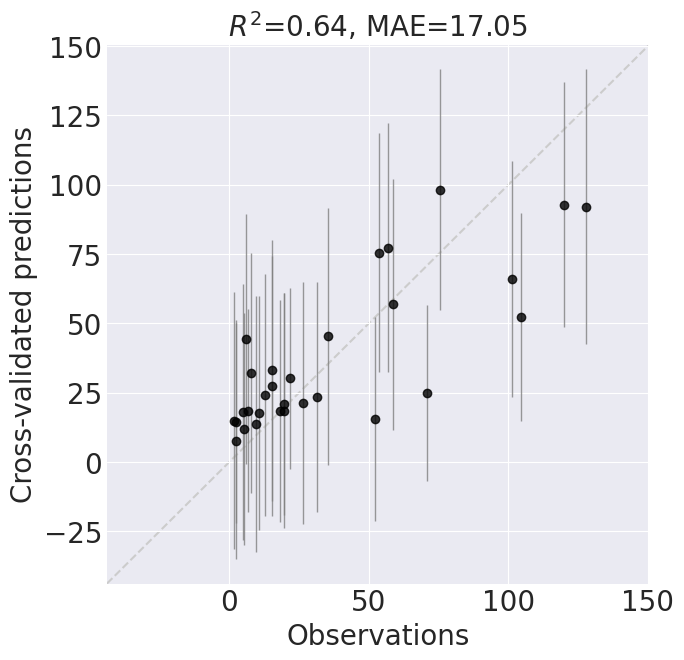

Building models…
Fitting L0 models…
Building TPOT models…


Version 0.12.0 of tpot is outdated. Version 0.12.1 was released Tuesday August 15, 2023.


Best pipeline: KNeighborsRegressor(Nystroem(GradientBoostingRegressor(input_matrix, alpha=0.85, learning_rate=0.001, loss=huber, max_depth=10, max_features=0.2, min_samples_leaf=14, min_samples_split=7, n_estimators=100, subsample=0.8500000000000001), gamma=0.35000000000000003, kernel=linear, n_components=10), n_neighbors=2, p=1, weights=uniform)
Done fitting L0 models in 31.05 s
Building ensemble model (2 sampling jobs)…


Multiprocess sampling (2 chains in 2 jobs)
NUTS: [sigma, omegas]


Sampling 2 chains for 1_000 tune and 10_000 draw iterations (2_000 + 20_000 draws total) took 21 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics


Done building ensemble model in 22.19 s


,MAE,MRAE(%),StdAE,MSE,$R^2$
Name,,,,,
Neural Regressor,0.097560,0.990360,0.222568,0.059054,0.999956
Random Forest Regressor,7.293367,67.463582,5.508094,83.532310,0.938116
Support Vector Regressor,25.816751,151.889853,28.865585,1499.726588,-0.111063
Kernel Ridge Regressor,12.574144,82.423719,11.951892,300.956820,0.777038
K-NN Regressor,14.385255,102.244064,14.015780,403.377638,0.701160
Gaussian Process Regressor,10.803244,92.259785,10.408810,225.053424,0.833271
Gradient Boosting Regressor,0.103705,1.008630,0.083743,0.017768,0.999987
TPOT Regressor,5.890276,15.320860,8.431967,105.793425,0.921624
Ensemble Model,5.422625,35.250675,6.147550,67.197242,0.950217


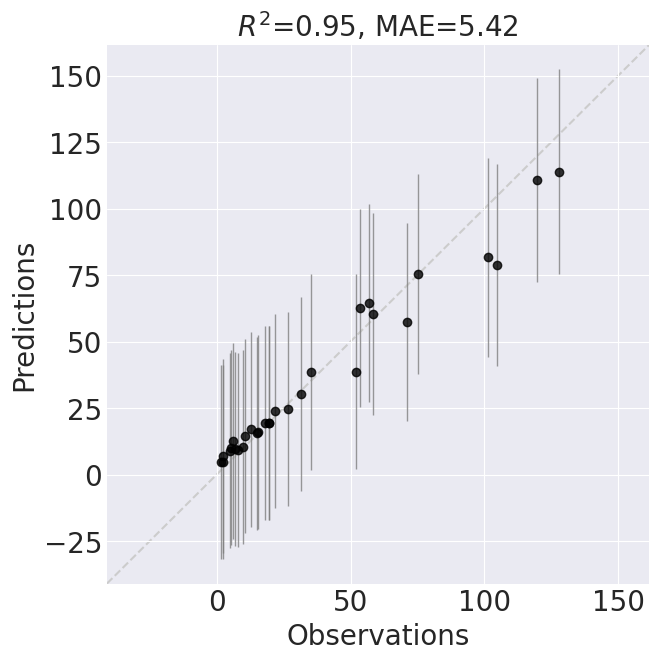

Done building models in 61.02 s
Starting parallel tempering using 2 chains…
Done with parallel tempering in 99.66 s
Choosing recommendations (19,800 candidates)…


Done choosing recommendations in 0.06 s


,ATOB_ECOLI,ERG8_YEAST,IDI_ECOLI,KIME_YEAST,MVD1_YEAST,Q40322_MENSP,Q8LKJ3_ABIGR,Q9FD86_STAAU,Q9FD87_STAAU,Limonene
0,0.216454,0.182835,0.871836,0.120528,0.256837,12.512528,4.742048,0.419888,0.553825,195.872341
1,0.215900,0.188501,0.861405,0.161552,0.250619,12.511505,4.743423,0.420762,0.553144,195.757506
2,0.218350,0.159900,0.844494,0.048450,0.245933,12.023267,4.715504,0.444732,0.553695,195.643165
3,0.219671,0.135643,0.807770,0.137708,0.307972,12.459719,4.732378,0.424593,0.563124,195.537114
4,0.211008,0.139817,0.785977,0.074189,0.276437,12.202173,4.706739,0.449287,0.579473,195.049140
5,0.207101,0.145475,0.624431,0.122545,0.450195,12.364990,4.742243,0.439156,0.592094,194.882605
6,0.220447,0.311283,1.857857,0.144713,0.288807,12.624500,4.729773,0.421428,0.543805,194.546902
7,0.212480,0.139026,0.774760,0.095766,0.305091,13.154003,4.685716,0.442739,0.550358,194.503860
8,0.205705,0.421033,1.824327,1.019254,0.300782,12.221613,4.723246,0.420483,0.540378,194.492677
9,0.226768,0.453613,1.885737,0.113235,0.306655,11.654483,4.748451,0.433521,0.540710,194.392703


Sampling: [y]


Sampling posterior predictive distributions…
Done sampling in 0.78 s


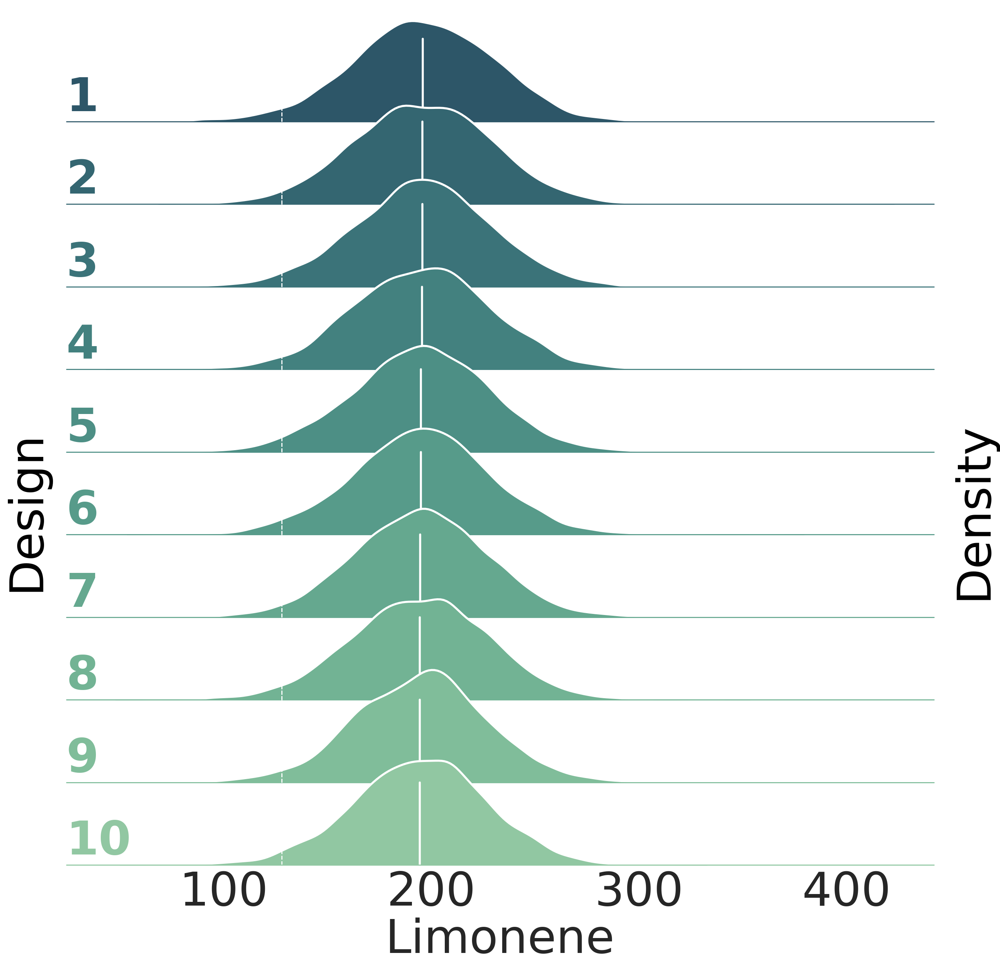

Sampling: [y]


Computing success probabilities…
Sampling posterior predictive distributions…
Done sampling in 0.72 s
Done computing success probabilities in 0.72 s


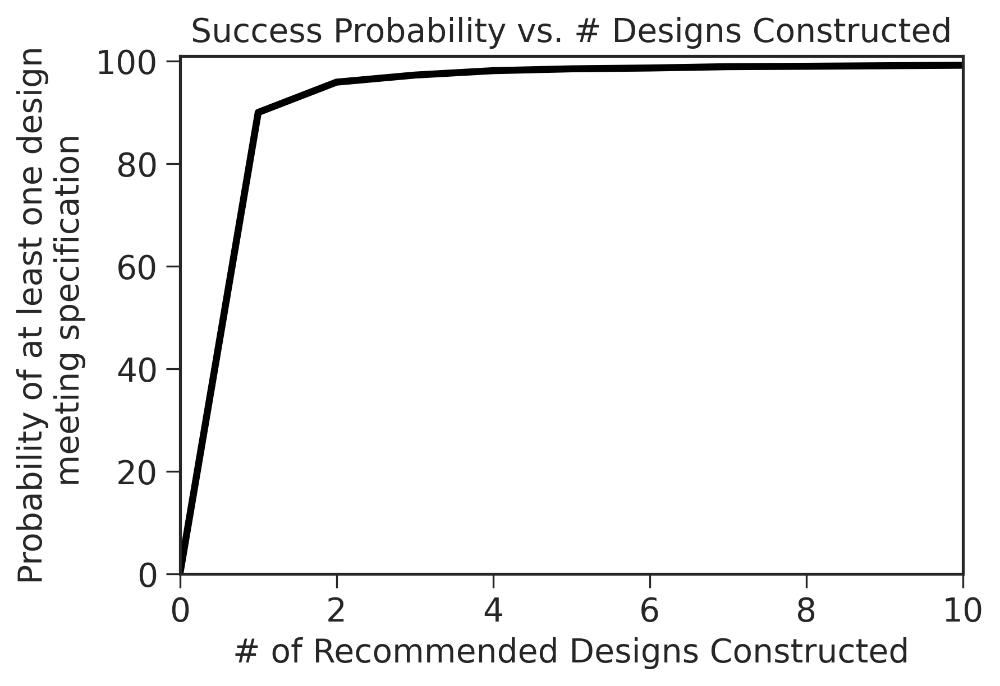

In [30]:
art2 = RecommendationEngine(df=df, **art_params)

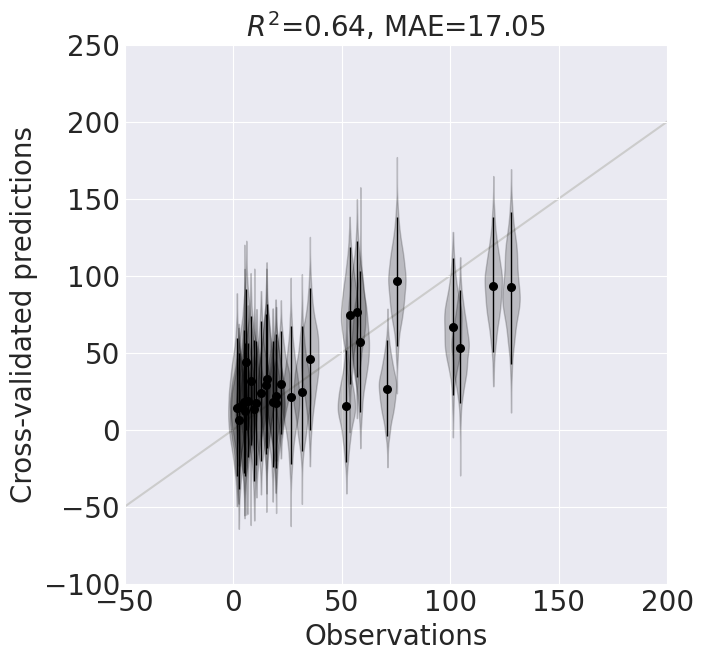

In [32]:
plot.predictions_distr_vs_observations(art2, cv=True, widths=8,
                                       x_limits=[[-50, 200]], y_limits=[[-100, 250]])


Sampling: [y]


Sampling posterior predictive distributions…
Done sampling in 0.73 s


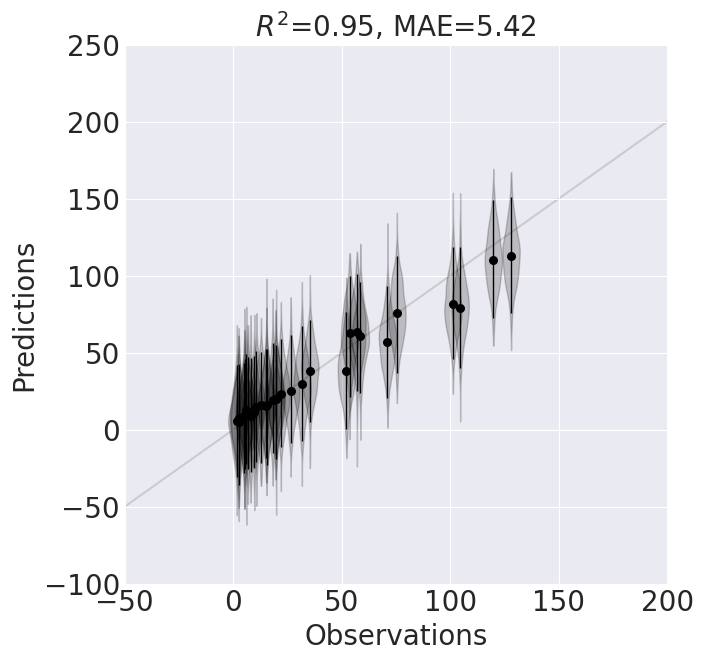

In [33]:
plot.predictions_distr_vs_observations(art2, cv=False, widths=8,
                                       x_limits=[[-50, 200]], y_limits=[[-100, 250]])


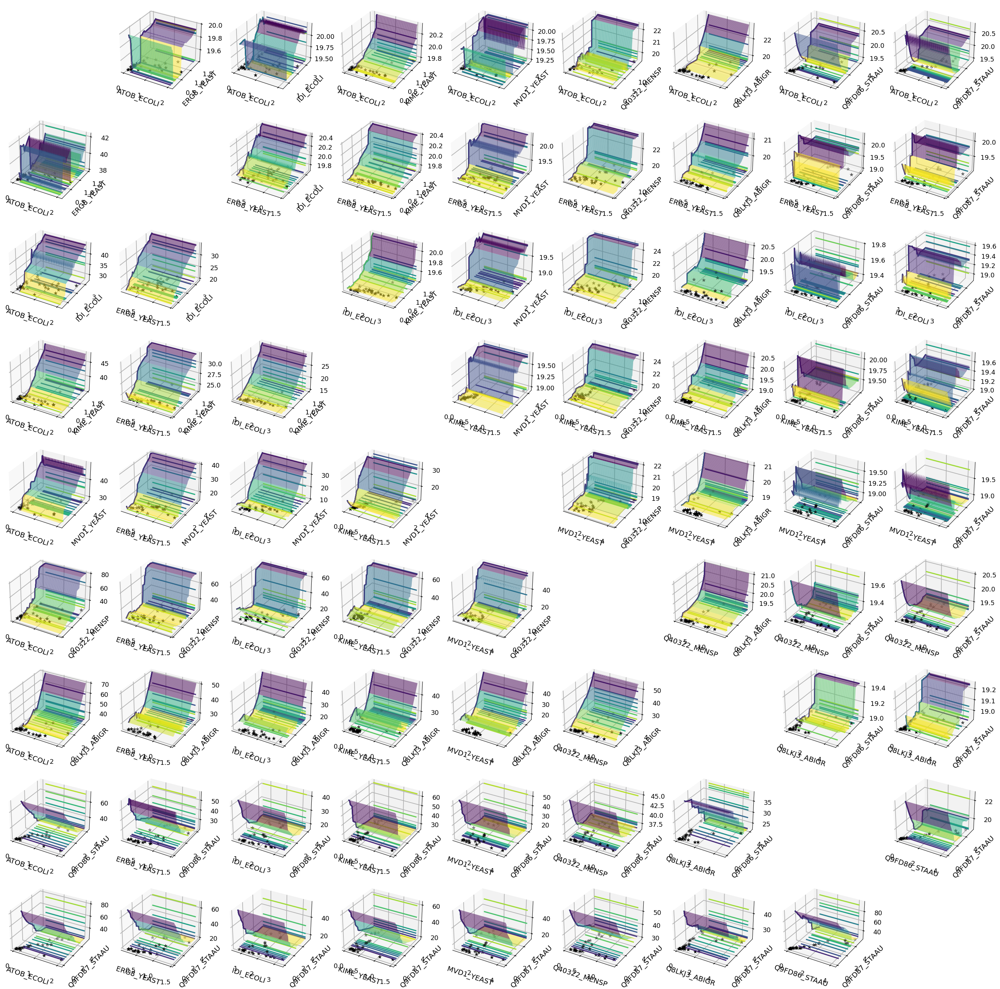

In [35]:
plot.model_pairwise(art2)

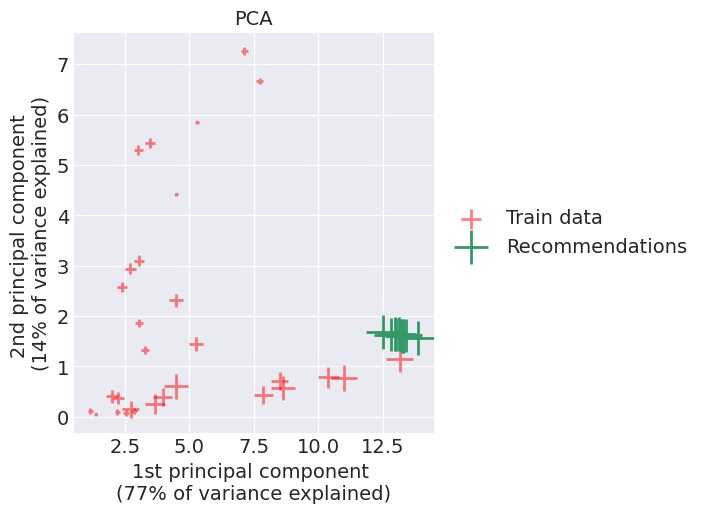

In [38]:
plot.recommendations_pc(art2, plot_scale_factor=3)


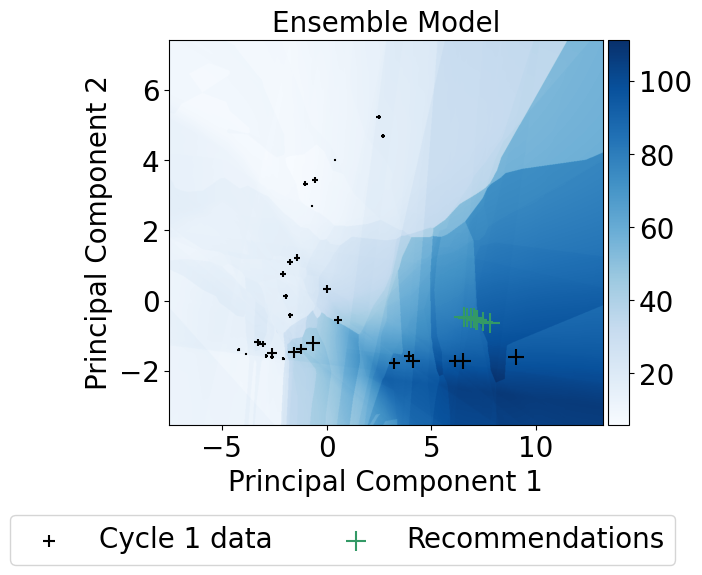

In [39]:
model = art2
plot.plot_model(model, art2, scaling_factor=1.5,
                midpoint=0.6, test_y=[],
                title='Ensemble Model', plot_points=True)